In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

In [ ]:
IMG_SIZE = 150
BATCH_SIZE = 32
EPOCHS = 15

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d masoudnickparvar/brain-tumor-mri-dataset
!unzip brain-tumor-mri-dataset.zip -d brain_mri

!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia
!unzip chest-xray-pneumonia.zip -d chest_xray

!kaggle datasets download -d fanconic/skin-cancer-malignant-vs-benign
!unzip skin-cancer-malignant-vs-benign.zip -d skin_cancer

!kaggle datasets download -d bmadushanirodrigo/fracture-multi-region-x-ray-data
!unzip fracture-multi-region-x-ray-data.zip -d fracture_xray


Streaming output truncated to the last 5000 lines.
  inflating: fracture_xray/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/train/not fractured/14-rotated2-rotated2-rotated3 (1).jpg  
  inflating: fracture_xray/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/train/not fractured/14-rotated2-rotated2-rotated3-rotated1 (1).jpg  
  inflating: fracture_xray/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/train/not fractured/14-rotated2-rotated2-rotated3-rotated1.jpg  
  inflating: fracture_xray/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/train/not fractured/14-rotated2-rotated2-rotated3.jpg  
  inflating: fracture_xray/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/train/not fractured/14-rotated2-rotated2.jpg  
  inflating: fracture_xray/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/train/not fractured/14-rotated2-rotated3 (1).jpg  
  infla

In [ ]:
import random

def sample_data(data, fraction=0.6):
    k = int(len(data) * fraction)
    return random.sample(data, k)

In [ ]:
def load_dataset(base_path, label, limit=None):
    data = []
    count = 0
    for root, _, files in os.walk(base_path):
        for file in files:
            img_path = os.path.join(root, file)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is not None:
                img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                data.append((img, label))
                count += 1
                if limit and count >= limit:
                    break
        if limit and count >= limit:
            break
    return data

#load and apply sampling here
print("📥 Loading Brain MRI...")
brain_data = load_dataset("brain_mri/Training", 0) \
           + load_dataset("brain_mri/Testing", 0)
brain_data = sample_data(brain_data, 0.6)

#load and apply sampling here
print("📥 Loading Chest X-Ray...")
chest_data = load_dataset("chest_xray/chest_xray/train", 1) \
           + load_dataset("chest_xray/chest_xray/val", 1) \
           + load_dataset("chest_xray/chest_xray/test", 1)
chest_data = sample_data(chest_data, 0.6)

#load and apply sampling here
print("📥 Loading Skin' Cancer...")
skin_data = load_dataset("skin_cancer/test", 2) \
           + load_dataset("skin_cancer/train", 2)
skin_data = sample_data(skin_data, 0.6)

#load and apply sampling here
print("📥 Loading Bone Data...")
bone_data = load_dataset("fracture_xray/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/test", 3) \
           + load_dataset("fracture_xray/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/train", 3) \
           + load_dataset("fracture_xray/Bone_Fracture_Binary_Classification/Bone_Fracture_Binary_Classification/val", 3)
bone_data = sample_data(bone_data, 0.6)


print(f"Brain MRI: {len(brain_data)} images")
print(f"Chest X-Ray: {len(chest_data)} images")
print(f"Skin Cancer: {len(skin_data)} images")
print(f"Bone Data: {len(bone_data)} images")

#combine them
all_data = brain_data + chest_data + skin_data + bone_data
random.shuffle(all_data)

📥 Loading Brain MRI...
📥 Loading Chest X-Ray...
📥 Loading Skin' Cancer...
📥 Loading Bone Data...
Brain MRI: 4213 images
Chest X-Ray: 3513 images
Skin Cancer: 1978 images
Bone Data: 6348 images


In [ ]:
import random

(x_cifar, y_cifar), _ = tf.keras.datasets.cifar10.load_data()

other_data = []
needed = min(len(brain_data), len(chest_data), len(skin_data), len(bone_data))

# shuffle indices before picking
indices = list(range(len(x_cifar)))
random.shuffle(indices)

for i in indices[:needed]:
    img = cv2.cvtColor(x_cifar[i], cv2.COLOR_RGB2GRAY)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    other_data.append((img, 4))  # Label 4 = Other


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


In [ ]:
all_data = brain_data + chest_data + bone_data + skin_data + other_data
np.random.shuffle(all_data)

X = np.array([d[0] for d in all_data]) / 255.0
y = np.array([d[1] for d in all_data])

X = X.reshape(-1, IMG_SIZE, IMG_SIZE, 1)

X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
print(f"✅ Dataset Ready: Train={len(X_train)}, Val={len(X_val)}")

✅ Dataset Ready: Train=14424, Val=3606


In [ ]:
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 1)),
    BatchNormalization(),
    MaxPooling2D((2,2)),

    Conv2D(64, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D((2,2)),

    Conv2D(128, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D((2,2)),

    Conv2D(256, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D((2,2)),

    GlobalAveragePooling2D(),

    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.3),

    Dense(5, activation='softmax')  # 5 classes
])

model.compile(
    optimizer=Adam(0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 148, 148, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 72, 72, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 34, 34, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 15, 15, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 489,093 (1.87 MB)

 Trainable params: 488,133 (1.86 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
callbacks = [
    ReduceLROnPlateau(monitor='val_accuracy', patience=2, verbose=1, factor=0.5, min_lr=0.00001),
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
]

history = model.fit(
    X_train, y_train,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=(X_val, y_val),
    callbacks=callbacks
)

Epoch 1/15
451/451 ━━━━━━━━━━━━━━━━━━━━ 34s 50ms/step - accuracy: 0.8674 - loss: 0.3823 - val_accuracy: 0.3189 - val_loss: 2.2645 - learning_rate: 0.0010
Epoch 2/15
451/451 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - accuracy: 0.9698 - loss: 0.1004 - val_accuracy: 0.9756 - val_loss: 0.0838 - learning_rate: 0.0010
Epoch 3/15
451/451 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - accuracy: 0.9882 - loss: 0.0402 - val_accuracy: 0.8466 - val_loss: 0.4673 - learning_rate: 0.0010
Epoch 4/15
451/451 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - accuracy: 0.9817 - loss: 0.0616 - val_accuracy: 0.9884 - val_loss: 0.0409 - learning_rate: 0.0010
Epoch 5/15
451/451 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - accuracy: 0.9914 - loss: 0.0297 - val_accuracy: 0.7626 - val_loss: 0.6956 - learning_rate: 0.0010
Epoch 6/15
451/451 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.9888 - loss: 0.0398
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
451/451 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - accuracy: 0.9888 - los

In [ ]:
from tensorflow.keras.preprocessing import image
import numpy as np
from google.colab import files
from PIL import Image
import matplotlib.pyplot as plt

# Define your class names
class_names = [
    "Brain MRI",
    "Chest X-Ray",
    "Skin Cancer",
    "Bone Fracture",
    "Other"
]

def upload_and_predict(model, img_size=150):
    """
    Upload multiple images, predict classes, and display results side by side.
    Args:
        model: Trained Keras model
        img_size: Size used during training (default 150)
    """
    uploaded = files.upload()  # allows selecting multiple files

    results = []

    for fn in uploaded.keys():
        # Load image in grayscale
        img = Image.open(fn).convert("L")
        img = img.resize((img_size, img_size))  # match training size

        # Convert to array
        img_array = np.array(img, dtype=np.float32) / 255.0
        img_array = np.expand_dims(img_array, axis=-1)   # (img_size,img_size,1)
        img_array = np.expand_dims(img_array, axis=0)    # (1,img_size,img_size,1)

        # Predict
        prediction = model.predict(img_array, verbose=0)
        predicted_class = np.argmax(prediction, axis=1)[0]
        confidence = prediction[0][predicted_class]

        results.append((fn, img, class_names[predicted_class], confidence))

    # 🔹 Plot all images side by side
    n = len(results)
    cols = min(4, n)  # max 4 images per row
    rows = (n + cols - 1) // cols

    plt.figure(figsize=(5*cols, 5*rows))

    for i, (fn, img, pred_class, confidence) in enumerate(results, start=1):
        plt.subplot(rows, cols, i)
        plt.imshow(img, cmap="gray")
        plt.axis("off")
        plt.title(f"{fn}\n{pred_class} ({confidence*100:.2f}%)")

    plt.tight_layout()
    plt.show()


Saving 1-rotated1-rotated1-rotated3-rotated1.jpg to 1-rotated1-rotated1-rotated3-rotated1.jpg
Saving 2-rotated1.jpg to 2-rotated1.jpg
Saving 2-rotated1-rotated2-rotated2-rotated1.jpg to 2-rotated1-rotated2-rotated2-rotated1.jpg
Saving 3-rotated1-rotated1-rotated3.jpg to 3-rotated1-rotated1-rotated3.jpg
Saving 3-rotated2-rotated3-rotated1.jpg to 3-rotated2-rotated3-rotated1.jpg
Saving 4-rotated1-rotated1-rotated2.jpg to 4-rotated1-rotated1-rotated2.jpg
Saving 4-rotated1-rotated1-rotated3.jpg to 4-rotated1-rotated1-rotated3.jpg
Saving 5-rotated3-rotated1-rotated1.jpg to 5-rotated3-rotated1-rotated1.jpg
Saving 6-rotated1-rotated3-rotated2.jpg to 6-rotated1-rotated3-rotated2.jpg
Saving 10-rotated1-rotated1-rotated1.jpg to 10-rotated1-rotated1-rotated1.jpg
Saving 10-rotated2-rotated2.jpg to 10-rotated2-rotated2.jpg
Saving 11-rotated3-rotated1.jpg to 11-rotated3-rotated1.jpg
Saving 12-rotated1-rotated1.jpg to 12-rotated1-rotated1.jpg
Saving 13-rotated1-rotated2-rotated1-rotated1.jpg to 13-ro

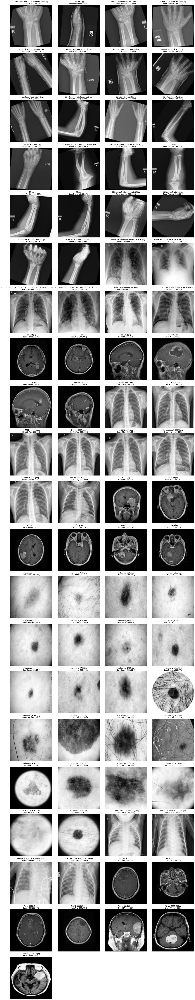

In [ ]:
upload_and_predict(model)

In [ ]:
model.save("gatekeeper_model.h5")